In [1]:
import torch
import cv2
import matplotlib.pyplot as plt
from matplotlib import gridspec
from CycleGAN_models import *
from tqdm.notebook import tqdm

ssdata = torch.load('../datasets/SSdataset.pt')
data = torch.load('../datasets/dataset.pt')
# torchio = torch.load('../datasets/torchiodataset.pt')


# extraAD1 = torch.load('../datasets/GAN/ADgan1.pt')
# extraAD2 = torch.load('../datasets/GAN/ADgan2.pt')
# extraAD3 = torch.load('../datasets/GAN/ADgan3.pt')
# extraNC1 = torch.load('../datasets/GAN/NCgan1.pt')
# extraNC2 = torch.load('../datasets/GAN/NCgan2.pt')
# extraNC3 = torch.load('../datasets/GAN/NCgan3.pt')

# extraAD = [([extraAD1[j][0], extraAD2[j][0], extraAD3[j][0]], extraAD1[j][1]) 
#               for j in tqdm(range(len(extraAD1))) ]
# extraNC = [([extraNC1[j][0], extraNC2[j][0], extraNC3[j][0]], extraNC1[j][1]) 
#               for j in tqdm(range(len(extraNC1))) ]

def norm(dataset):
    output = []
    for sample in dataset:
        newimg = []
        img = sample[0]
        label = sample[1]
        for s in img:
            s = s[0]
            s /= torch.max(s)
            s = torch.stack([s, s, s], 0)
            newimg.append(s)
        output.append((newimg, label))
    return output

data = norm(data)
ssdata = norm(ssdata)

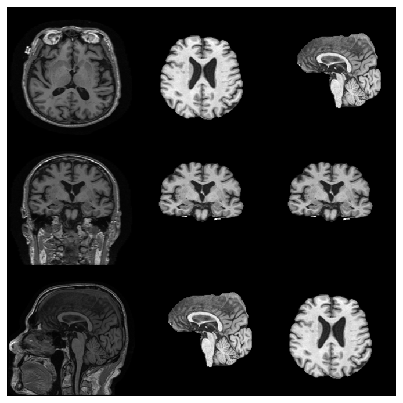

In [2]:
a = 1

fig = plt.figure(figsize=(12, 12)) 

gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1],
     wspace=0.0, hspace=0.0, top=0.5, bottom=0.05, left=0.17, right=0.62) 

for i in range(3):
    ax= plt.subplot(gs[i,0])
    ax.imshow(data[a][0][i][0],cmap = 'gray')
    plt.axis('off')

for i in range(3):
    ax= plt.subplot(gs[i,1])
    ax.imshow(ssdata[a][0][i][0],cmap = 'gray')
    plt.axis('off')
    
for i in [2,1,0]:
    ax= plt.subplot(gs[2-i,2])
    ax.imshow(ssdata[a][0][i][0],cmap = 'gray')
    plt.axis('off')

plt.show()


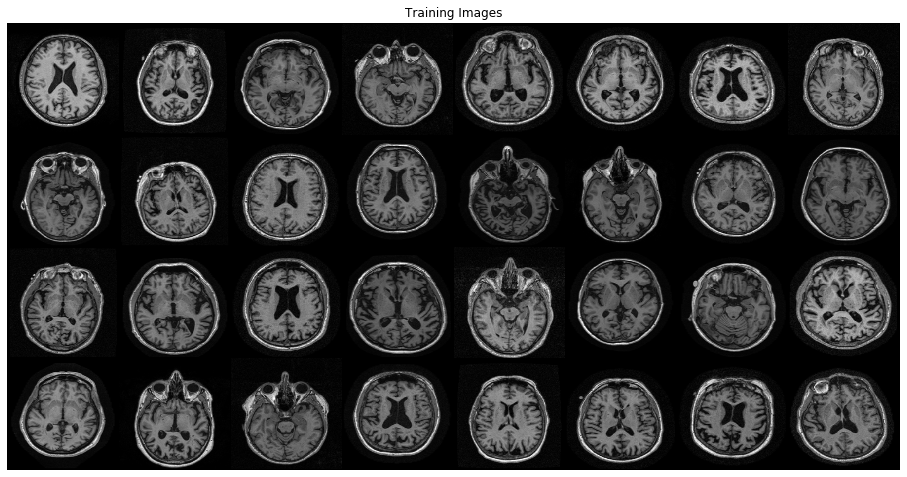

In [3]:
import torchvision
from torch.utils.data import Dataset, DataLoader
dataloader = DataLoader(data, batch_size=32,shuffle=True, num_workers=4)
batch = next(iter(dataloader))
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(
    torchvision.utils.make_grid(batch[0][0], padding=2, normalize=True),(1,2,0)))
plt.show()

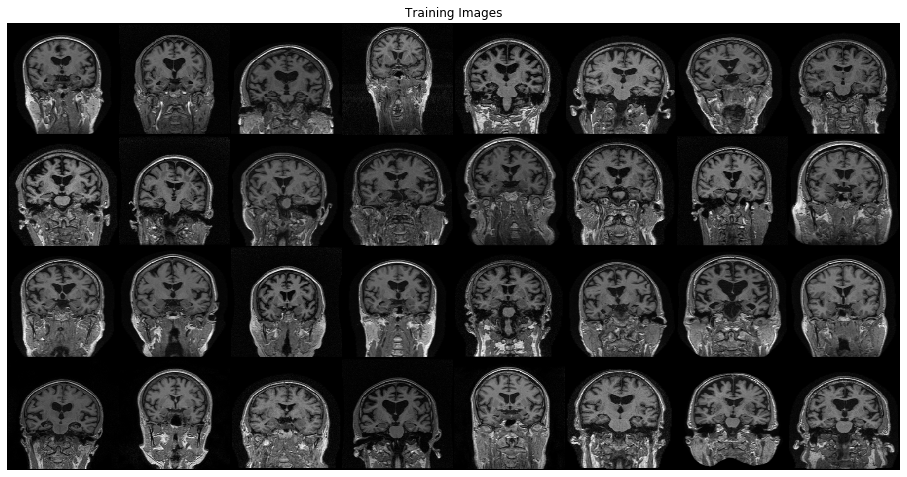

In [4]:
import torchvision
from torch.utils.data import Dataset, DataLoader
dataloader = DataLoader(data, batch_size=32,shuffle=True, num_workers=4)
batch = next(iter(dataloader))
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(
    torchvision.utils.make_grid(batch[0][1], padding=2, normalize=True),(1,2,0)))
plt.show()

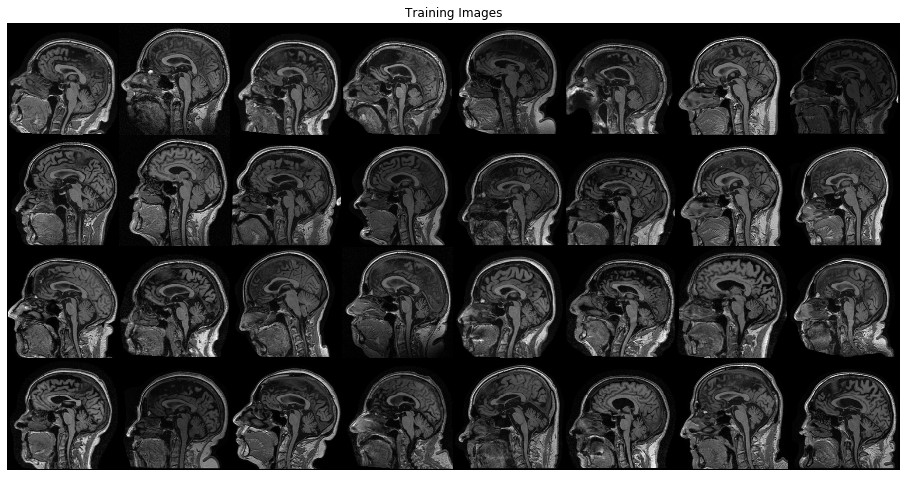

In [6]:
import torchvision
from torch.utils.data import Dataset, DataLoader
dataloader = DataLoader(data, batch_size=32,shuffle=True, num_workers=4)
batch = next(iter(dataloader))
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(
    torchvision.utils.make_grid(batch[0][2], padding=2, normalize=True),(1,2,0)))
plt.show()

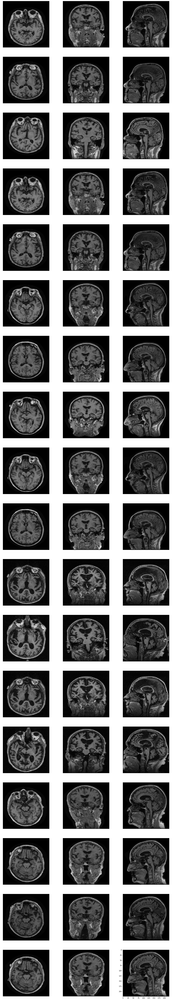

In [7]:
fig = plt.figure(figsize = (20,120))
num = 1
for i in range(18):
    for s in range(3):
        plt.axis("off")
        y = fig.add_subplot(18, 3, num)    
        y.imshow(data[i][0][s][0], cmap = 'gray')
        num += 1

plt.show()

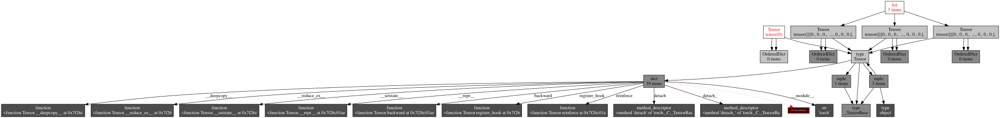

In [9]:
import objgraph
objgraph.show_refs(data[0], filename='datastructure.png')


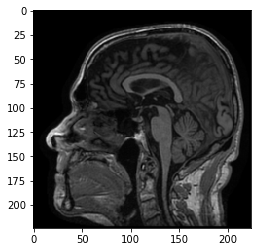

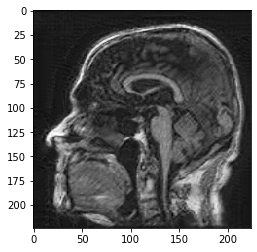

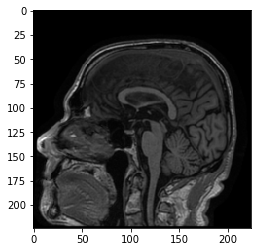

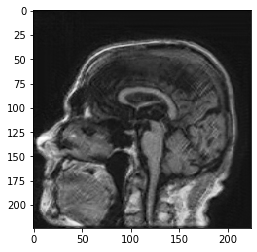

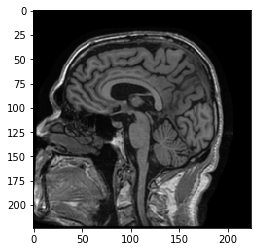

...

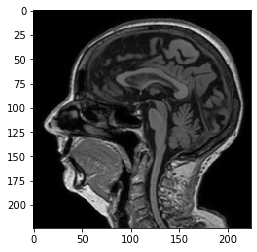

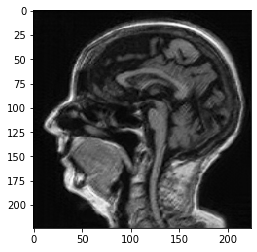

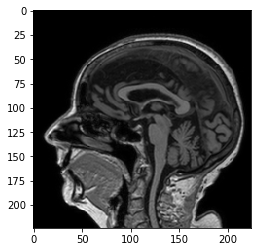

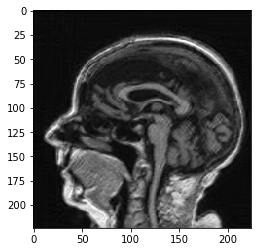

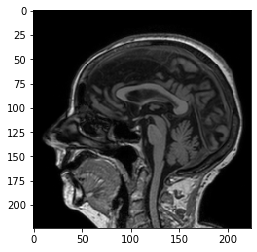

KeyboardInterrupt: 

In [10]:
import torch
from CycleGAN_models import *
from tqdm.notebook import tqdm
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

dataset = torch.load("../datasets/dataset.pt")
# dataset = [sample for sample in torchio if sample != None]

NC = []
AD = []

for i in dataset:
    if i[1] == 0:
        NC.append(i)
    else:
        AD.append(i)
        
def process_gan(dataset, s):
    
    output = []
    dataset = [sample[0] for sample in dataset]
    for sample in dataset:
        sample = sample[s][0]
        sample /= torch.max(sample)
        output.append(torch.unsqueeze(sample, 0))
    return output

        
NCset1 = process_gan(NC, 0)
NCset2 = process_gan(NC, 1)
NCset3 = process_gan(NC, 2)

ADset1 = process_gan(AD, 0)
ADset2 = process_gan(AD, 1)
ADset3 = process_gan(AD, 2)

epoch = 25
input_shape = (1, 224, 224)
dataset_name = 'CycleGAN1'

G_AB = GeneratorResNet(input_shape, 9).cuda()
G_BA = GeneratorResNet(input_shape, 9).cuda()
G_AB.load_state_dict(torch.load("saved_models/%s/G_AB_%d.pth" % (dataset_name, epoch)))
G_BA.load_state_dict(torch.load("saved_models/%s/G_BA_%d.pth" % (dataset_name, epoch)))

for imgs in tqdm(NCset3):

    G_AB.eval()
    
    real_A = torch.unsqueeze(Variable(imgs.type(torch.cuda.FloatTensor)), 0)
    fake_B = torch.squeeze(G_AB(real_A))
    fake_B = fake_B.detach().cpu()
    real_A = torch.squeeze(real_A.detach().cpu())
    
    plt.imshow(real_A, cmap = 'gray')
    plt.show()
    plt.imshow(fake_B, cmap = 'gray')
    plt.show()

In [1]:
plt.imshow(dataset[0][0][0][0], cmap = 'gray')
plt.show()
plt.imshow(NCset1[0][0], cmap = 'gray')
plt.show()

NameError: name 'plt' is not defined